# Audio source separation

Requires `scipy==1.10.1` and `mdct==0.4`. 

Execute the next cell to install these libraries then restart the kernel.

In [534]:
!pip install --break-system-packages scipy==1.10.1 mdct==0.4

Defaulting to user installation because normal site-packages is not writeable


In [535]:
# imports
import matplotlib.pyplot as plt
import numpy as np
import scipy.io.wavfile as wavfile
from scipy.signal import hamming
from scipy.spatial.distance import cdist

import IPython.display as ipd
from mdct.fast import mdct, imdct
from scipy.io.wavfile import write
import cmath

plt.rcParams['figure.figsize'] = (12,8)

In [536]:
# useful functions

def plot_sound(data, rate, title=None):
    if data.ndim == 1:
        data = data[:,np.newaxis]
    times = np.arange(data.shape[0])/rate
    plt.figure(figsize=(30,6))
    for channel in data.T:
        plt.fill_between(times, channel)
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    plt.xlim(times[0], times[-1])
    if title:
        plt.title(title)
    plt.show()
    
def play_sound(data, rate):
    return ipd.display(ipd.Audio(data.T, rate=rate))

T = 220501, M = 2


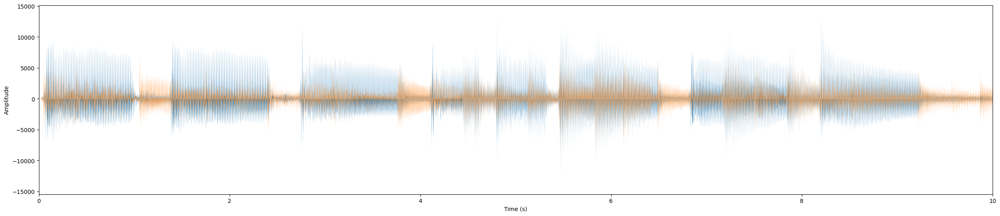

In [537]:
fname = 'mix.wav'

rate, x = wavfile.read(fname)
print('T = {:d}, M = {:d}'.format(*x.shape))
plot_sound(x, rate)
play_sound(x, rate)

In [538]:
write('new_mix.wav', rate, np.array(x, dtype=np.int16)) # to write a new wave file

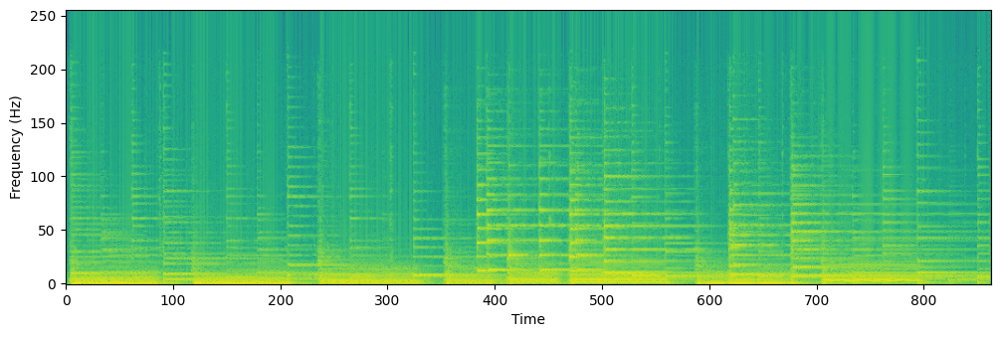

In [539]:
X = mdct(x, window=hamming, framelength=512)
Z = X.view(dtype=np.complex128)[...,0]

X_norm = np.abs(Z)**2

plt.imshow(np.log(X_norm+1e-10), origin='lower')
plt.xlabel('Time')
plt.ylabel('Frequency (Hz)')
plt.show()

    1

    I hear 3 instruments, two guitares and a piano.
    They all have different directions, the piano is on the front, the first guitare is on the left and the second guitare is on the right.

    2. temporal dispersion diagram (x(t,1), x(t,2)).

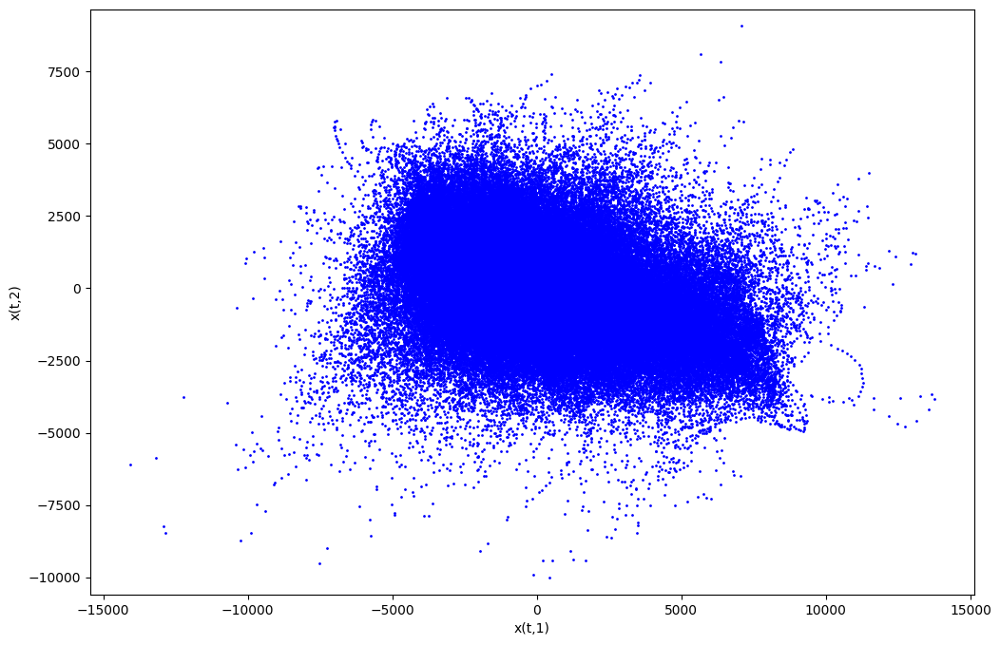

In [540]:
# scatter plot
plt.scatter(x[:,0], x[:,1], c='b', s=1)
plt.xlabel('x(t,1)')
plt.ylabel('x(t,2)')
# axis equal
plt.axis('equal')
plt.show()


    From the temporal dispersion diagram we cannot distinguish the directions of the sources.

    3

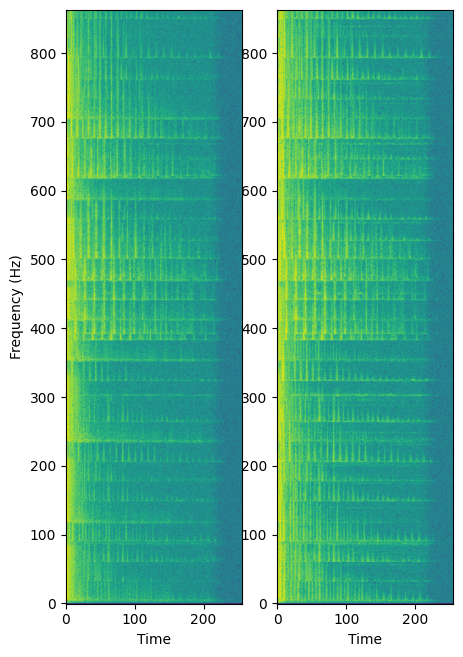

In [541]:
F = 512
mdct_x = mdct(x, window=hamming, framelength=F)
X0 = mdct(x[:,0], framelength=F)
X1 = mdct(x[:,1], framelength=F)

plt.figure(figsize=(5,20))
plt.subplot(1,2,1)
plt.imshow(np.log(np.abs(X0.T)**2+1e-10), origin='lower')
plt.xlabel('Time')
plt.ylabel('Frequency (Hz)')

plt.subplot(1,2,2)
plt.imshow(np.log(np.abs(X1.T)**2+1e-10), origin='lower')
plt.xlabel('Time')
plt.show()

    4. Time-frequency dispersion diagram

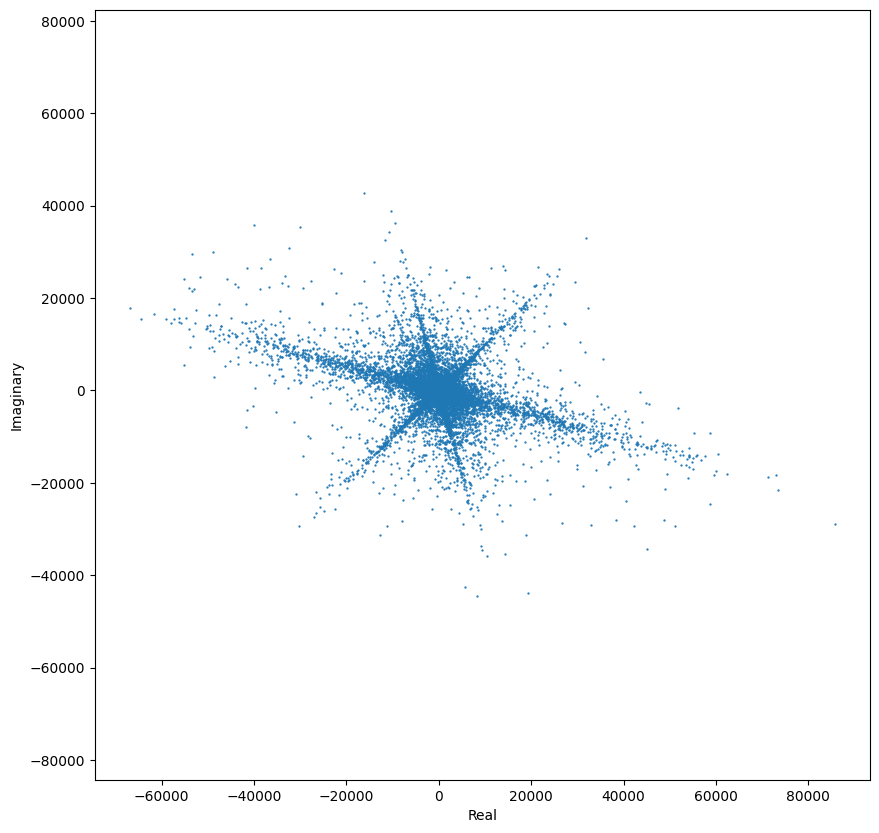

In [542]:

Z = X0 + 1j*X1

plt.figure(figsize=(10,10))
plt.scatter(Z.real, Z.imag, s=0.4)
plt.xlabel('Real')
plt.ylabel('Imaginary')
plt.axis('equal')
plt.show()

    We can distinguich three major directions in this diagram.

    5. Histogram of the arguments

In [543]:
angles = np.angle(Z.flatten()) % (np.pi)

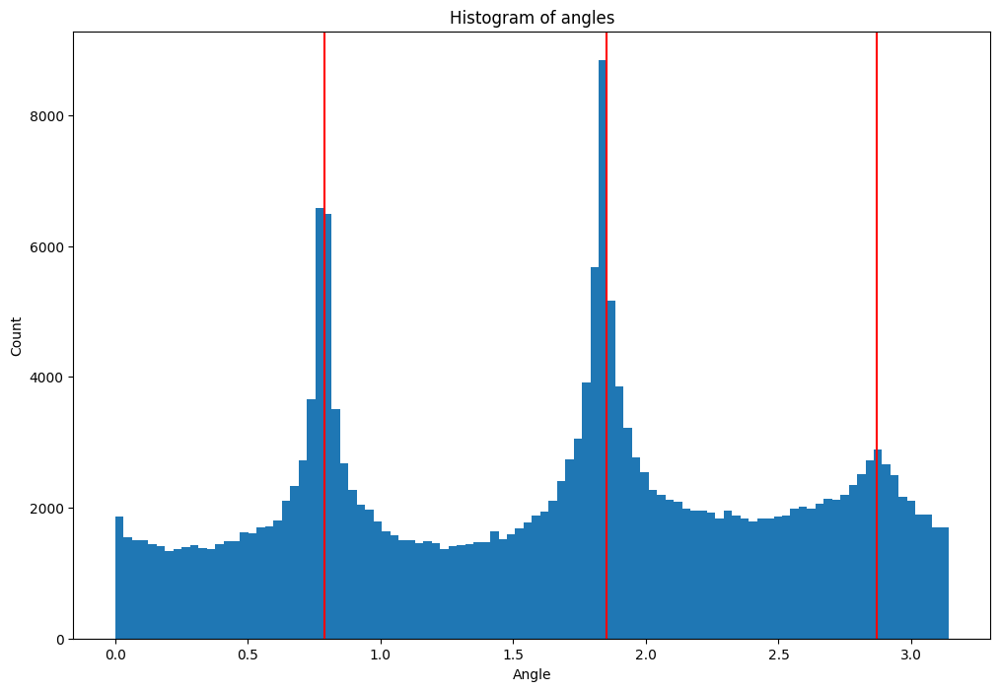

In [544]:
plt.hist(angles, bins=100)

plt.axvline(1.85, color='r')
plt.axvline(0.79, color='r')
plt.axvline(2.87, color='r')

plt.title('Histogram of angles')
plt.xlabel('Angle')
plt.ylabel('Count')
plt.show()

Estimate the angles θ(k) (you can determine these values graphically from the histogram).

we can see three major directions in the histogram. The angles are approximately $0.79$, $1.85$ and $2.87$ degrees.
    

In [545]:
# let's note these angles
theta = [0.79, 1.85, 2.87]

    6. Estimating active source in ever bin (f, n)

In [546]:
f, n = Z.shape
B = np.zeros((f, n, 3))

for k in range(n):
  for f_k in range(f):
    theta_f_k = np.angle(Z[f_k, k])%np.pi
    norms = np.abs(np.sin(np.array([theta_f_k - theta[0], theta_f_k - theta[1], theta_f_k - theta[2]])))
    # 1 in the source with the smallest error (norm)
    B[f_k, k, np.argmin(norms)] = 1

    7.

In [547]:
B_ = np.expand_dims(B, axis=2)
B_ = np.repeat(B_, 2, axis=2)

Y = np.zeros((f, n, 2, 3))

Y[:, :, :, 0] = B_[..., 0] * mdct_x
Y[:, :, :, 1] = B_[..., 1] * mdct_x
Y[:, :, :, 2] = B_[..., 2] * mdct_x


x_1 = imdct(Y[..., 0], framelength=F)
x_2 = imdct(Y[..., 1], framelength=F)
x_3 = imdct(Y[..., 2], framelength=F)


In [548]:
play_sound(x_1, rate)

In [549]:
play_sound(x_2, rate)

In [550]:
play_sound(x_3, rate)

    We can see that this method, eventhough it let's some background noise for the first audio, it works. The seperation is a bit noisy and we feel like the cut is not smooth, maybe B shouldn't be strictly Binary.

    9.MMSE

In [551]:
Z = mdct_x.view(dtype=np.complex128)[...,0]
Z.shape

(256, 863)

In [552]:
S = np.zeros((f, n, 3))
for k in range(n):
  for f_k in range(f):
    theta_f_k = np.angle(Z[f_k, k])%np.pi
    S[f_k, k, :] = np.cos(theta_f_k)*Y[f_k, k, 0] + np.sin(theta_f_k)*Y[f_k, k, 0]

s_0 = S[..., 0]
s_1 = S[..., 1]
s_2 = S[..., 2]

In [553]:
s0 = imdct(s_0, framelength=F)
s1 = imdct(s_1, framelength=F)
s2 = imdct(s_2, framelength=F)

In [554]:
play_sound(s0, rate)

In [555]:
play_sound(s1, rate)

In [556]:
play_sound(s2, rate)

    In this case, we can see that the separation is not as good as the previous one. The audios are well separated but the noise is a bit enhaced. The separation is not as smooth as the previous one.

    10.

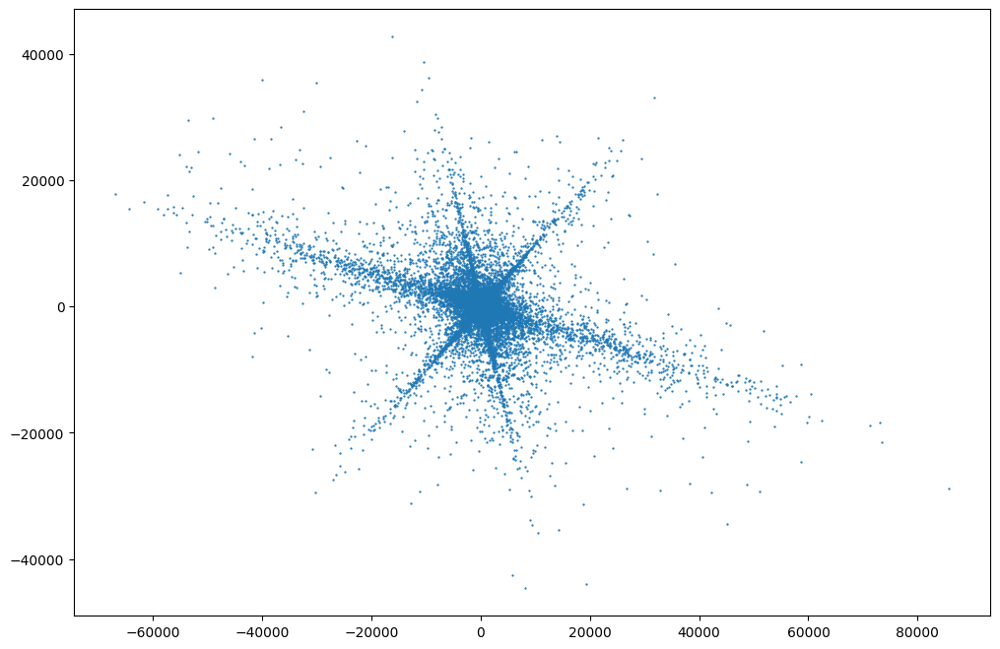

In [557]:
plt.scatter( X0, X1, s=0.4)
plt.show()

    Let's first just do a rotation pi/2 of the angles.

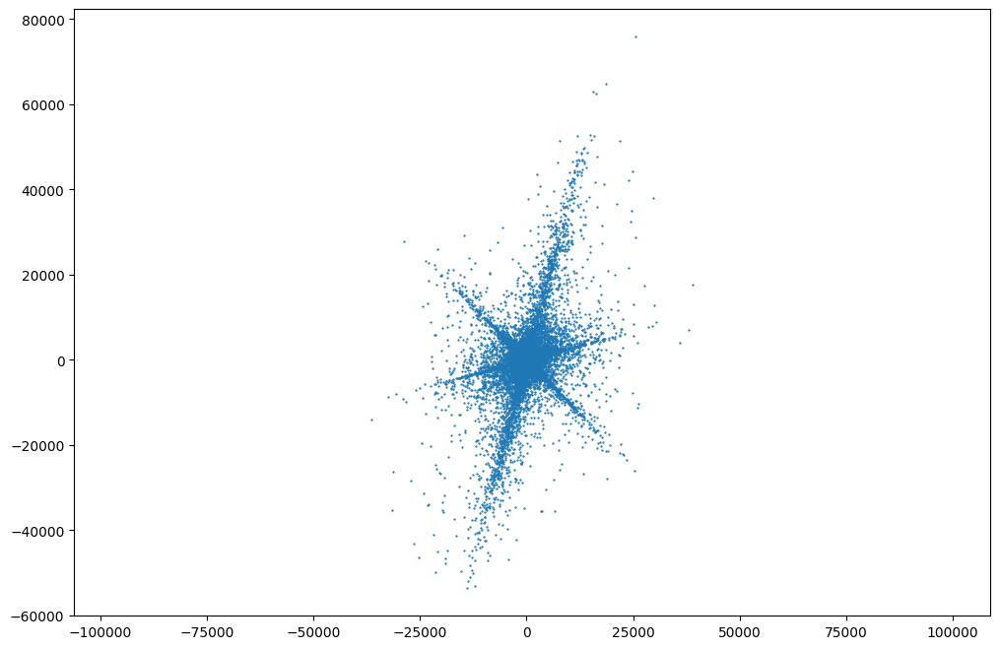

In [558]:
import cmath

Z_rotated = Z * cmath.exp(1j * np.pi/2)
X_rotated = np.zeros(X.shape)
X_rotated[:,:,0] = Z_rotated.real
X_rotated[:,:,1] = Z_rotated.imag


plt.scatter(X_rotated[:,:,0],X_rotated[:,:,1], s=0.4)
plt.axis("equal")
plt.show()

In [559]:
# original sound
play_sound(x, rate)

In [560]:
# let's reconstruct the sound
x_rotated = imdct(X_rotated, framelength=F)
play_sound(x_rotated, rate)

    We now try to permute the angles.

In [561]:
angles_permuted = [theta[1], theta[2], theta[0]]

In [562]:
# permutation of the angles of mdct_x
S_permuted = np.zeros((f, n, 3))
for k in range(n):
  for f_k in range(f):
    for src, angle in enumerate(angles_permuted):
      S_permuted[f_k, k, src] =  np.cos(angle)*Y[f_k, k, 0, src] + np.sin(angle)*Y[f_k, k, 1, src]

s0_permuted = imdct(S_permuted[..., 0], framelength=F)
s1_permuted = imdct(S_permuted[..., 1], framelength=F)
s2_permuted = imdct(S_permuted[..., 2], framelength=F)

In [567]:
# to reconstruct the sound with DUET
cos = np.cos(angles_permuted)
sin = np.sin(angles_permuted)
A = np.column_stack((cos, sin))

X_new = np.zeros(mdct_x.shape)
for k in range(n):
  for f_k in range(f):
    X_new[f_k, k] = S_permuted[f_k, k] @ A

In [571]:
# original sound
play_sound(x, rate)

In [572]:
x_new = imdct(X_new, framelength=F)
play_sound(x_new, rate)

    we can see that the synthesis is not perfect, the reconstraction let an effect or a noise in the background, like in the rotation case, it's like a buzz or a hiss sound, I didn't found the name of this defect.

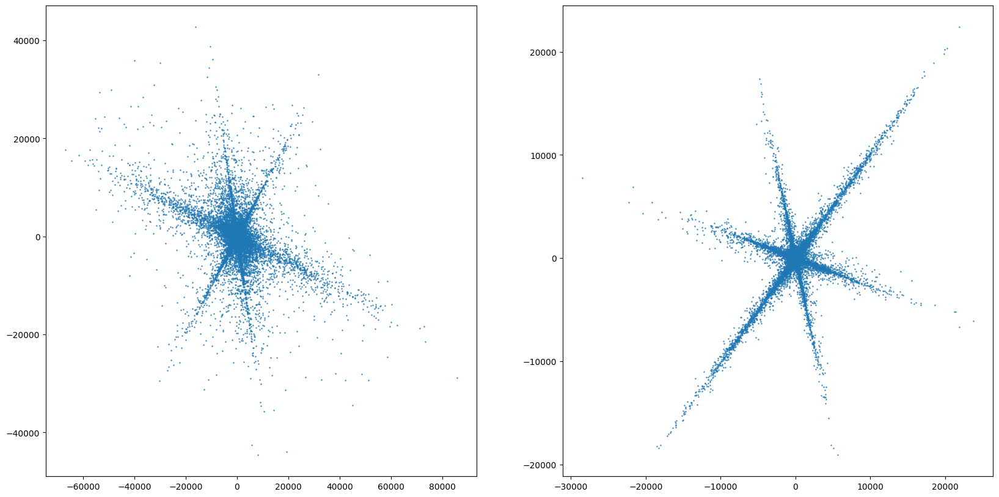

In [573]:
mdct_x_new = mdct(x_new, window=hamming, framelength=F)

# original 

plt.figure(figsize=(20,10))
plt.subplot(1, 2, 1)
plt.scatter(X0, X1, s=0.4)
# new 
plt.subplot(1, 2, 2)
plt.scatter(mdct_x_new[..., 0], mdct_x_new[..., 1], s=0.4)
plt.show()

we 